**1.  Converting video format** 

In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from glob import glob

import IPython.display as ipd
from tqdm import tqdm

import subprocess

plt.style.use('ggplot')
input_file ='../input//video-of-newyork/Driving Downtown - New York City 4K - USA.mp4'
subprocess.run(['ffmpeg',
                '-i',
                input_file,
                '-qscale',
                '0',
                'Driving Downtown - New York City 4K - USA.mp4',
                '-loglevel',
                'quiet']
              )
!ls -GFlash --color

ipd.Video('Driving Downtown - New York City 4K - USA.mp4', width=700)


total 4.5M
4.0K drwxr-xr-x 2 root 4.0K Mar 28 08:29  ./
4.0K drwxr-xr-x 8 root 4.0K Mar 28 08:29  ../
4.4M -rw-r--r-- 1 root 4.4M Mar 28 08:29 'Driving Downtown - New York City 4K - USA.mp4'
 20K ---------- 1 root  19K Mar 28 08:29  __notebook__.ipynb


2.**Open the Video and Read Metadata**

In [2]:
import cv2
cap = cv2.VideoCapture('Driving Downtown - New York City 4K - USA.mp4')
frame_count = cap.get(cv2.CAP_PROP_FRAME_COUNT)
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f'Height {height}, Width {width}')
print("frame count:",frame_count)
cap.release()

Height 1080.0, Width 1920.0
frame count: 452.0


3. **Extracting Images from Video**. 

In [3]:
cap = cv2.VideoCapture('Driving Downtown - New York City 4K - USA.mp4')
ret, img = cap.read()
print(f'Returned {ret} and img of shape {img.shape}')

Returned True and img of shape (1080, 1920, 3)


In [4]:
import matplotlib.pyplot as plt
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

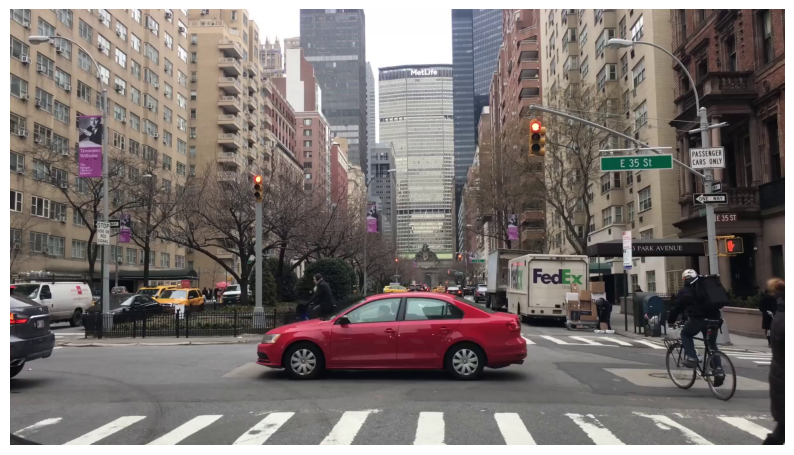

In [5]:
display_cv2_img(img)

In [6]:
cap.release()

**Display multiple frames from the video**

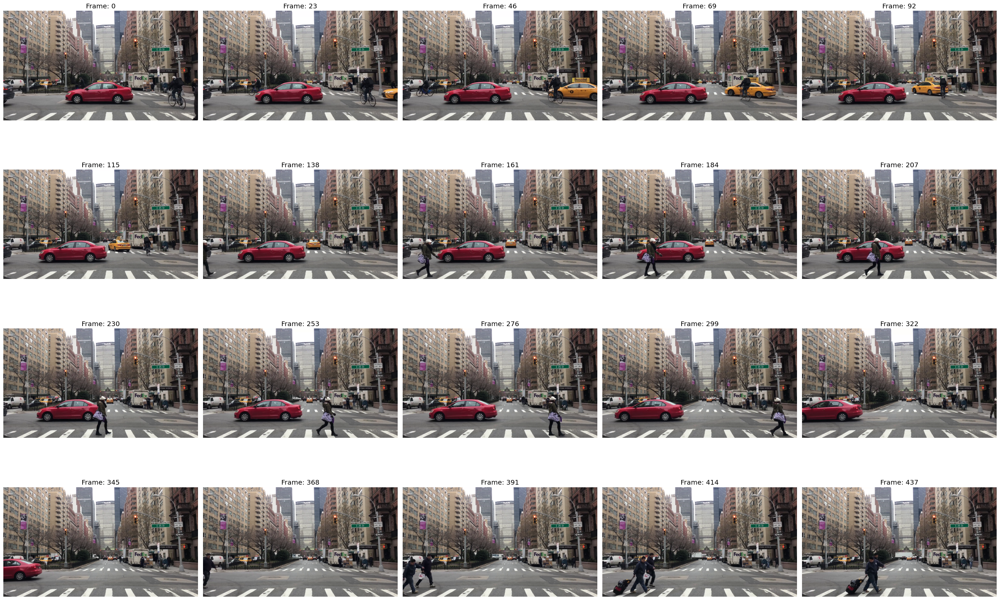

In [7]:
fig, axs = plt.subplots(4, 5, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture("Driving Downtown - New York City 4K - USA.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 23 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

**Add Annotations to Video Images**

In [8]:
import pandas as pd
labels = pd.read_csv('../input/realdataset/NEW_with_category.csv',low_memory=False)
video_labels = (
    labels.query('VideoName == "Driving Downtown - New York City 4K - USA"').reset_index(drop=True).copy()
)
video_labels["video_frame"] = (video_labels["frame_index"] * 11.9).round().astype("int")
video_labels["Category"].value_counts()

Category
car              2740
person           1579
traffic light    1299
truck             593
bicycle           214
handbag           132
backpack           58
suitcase           21
Name: count, dtype: int64

In [9]:
import cv2
cap = cv2.VideoCapture("Driving Downtown - New York City 4K - USA.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 414:
        break
cap.release()

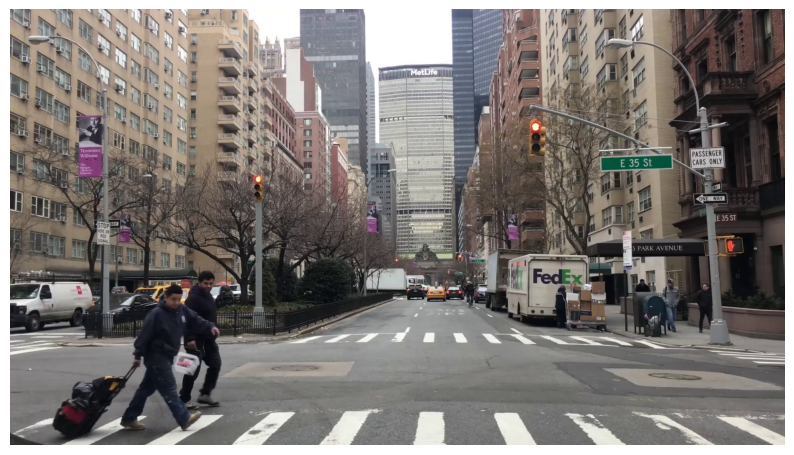

In [10]:
display_cv2_img(img)

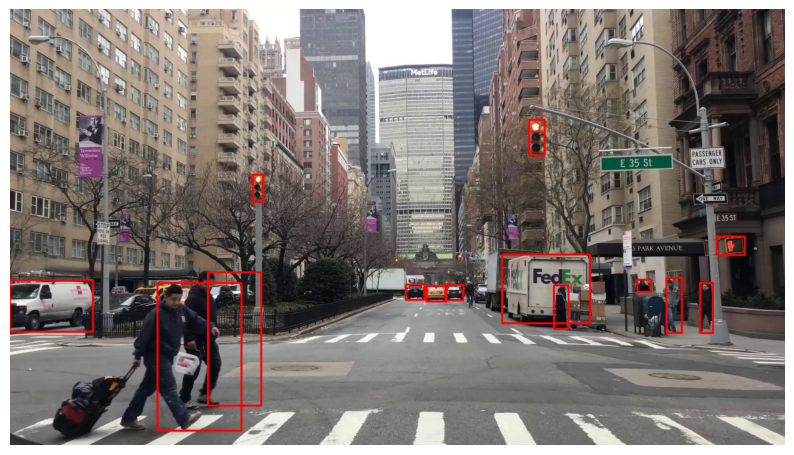

In [11]:
import cv2
import numpy as np

img_example = img.copy()

frame_labels = video_labels.query('frame_index == 414')

img_h, img_w, _ = img.shape  

for i, d in frame_labels.iterrows():
    x_center = int(d['X_center'] * img_w)
    y_center = int(d['Y_center'] * img_h)
    width = int(d['Width'] * img_w)
    height = int(d['Height'] * img_h)

    pt1 = (x_center - width // 2, y_center - height // 2)
    pt2 = (x_center + width // 2, y_center + height // 2)
    cv2.rectangle(img_example, pt1, pt2, (0, 0, 255), 3)

display_cv2_img(img_example)



**output vdo**

In [12]:
import cv2
from tqdm import tqdm

VIDEO_CODEC = "mp4v"
fps = 59.94
width = 1920
height = 1080

cap = cv2.VideoCapture("../input/output/output.mp4")
if not cap.isOpened():
    print("Error: Could not open video file.")
    exit()

# Get the total number of frames
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

# Define the VideoWriter
out = cv2.VideoWriter("out_test.mp4",
                      cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                      fps,
                      (width, height))

# Process each frame
for frame in tqdm(range(n_frames), total=n_frames):
    ret, img = cap.read()
    if not ret:  # If no frame is returned, break
        print(f"Warning: Frame {frame} could not be read.")
        break
    
    
    img = cv2.resize(img, (width, height))  

    # Write frame to the output video
    out.write(img)

# Release resources
out.release()
cap.release()

print("Video processing completed successfully.")

100%|██████████| 445/445 [00:08<00:00, 49.69it/s]

Video processing completed successfully.


In [13]:
import subprocess
import IPython.display as ipd

input_file = '../input/output/output.mp4'
output_file = 'output.mp4'

# Run FFmpeg for H.264 compression
subprocess.run(['ffmpeg',
                '-i', input_file,
                "-crf", "18",
                "-preset", "veryfast",
                '-loglevel', 'quiet',
                output_file]
              )

# List files (use 'dir' instead of 'ls' on Windows)
!ls -GFlash --color  

# Display the compressed video
ipd.Video(output_file, width=700)

total 62M
4.0K drwxr-xr-x 2 root 4.0K Mar 28 08:30  ./
4.0K drwxr-xr-x 8 root 4.0K Mar 28 08:29  ../
4.4M -rw-r--r-- 1 root 4.4M Mar 28 08:29 'Driving Downtown - New York City 4K - USA.mp4'
 11M ---------- 1 root  11M Mar 28 08:30  __notebook__.ipynb
 12M -rw-r--r-- 1 root  12M Mar 28 08:30  output.mp4
 35M -rw-r--r-- 1 root  35M Mar 28 08:30  out_test.mp4


In [14]:
import subprocess
import IPython.display as ipd

input_file = '../input/output/output.mp4'
output_file = 'output_slow.mp4'

# Slow down video to half speed (2x slower)
subprocess.run([
    'ffmpeg', '-i', input_file,
    '-filter:v', 'setpts=2.0*PTS',  # Increase PTS to slow down
    '-preset', 'veryfast',
    '-crf', '18',
    '-loglevel', 'quiet',
    output_file
])

# Display the slowed-down video
ipd.Video(output_file, width=700)


